# <font style="color:blue">Project 4: Kaggle Competition - Semantic Segmentation</font>

#### Maximum Points: 100

<div>
    <table>
        <tr><td><h3>Sr. no.</h3></td> <td><h3>Section</h3></td> <td><h3>Points</h3></td> </tr>
        <tr><td><h3>1</h3></td> <td><h3>1.1. Dataset Class</h3></td> <td><h3>7</h3></td> </tr>
        <tr><td><h3>2</h3></td> <td><h3>1.2. Visualize dataset</h3></td> <td><h3>3</h3></td> </tr>
        <tr><td><h3>3</h3></td> <td><h3>2. Evaluation Metrics</h3></td> <td><h3>10</h3></td> </tr>
        <tr><td><h3>4</h3></td> <td><h3>3. Model</h3></td> <td><h3>10</h3></td> </tr>
        <tr><td><h3>5</h3></td> <td><h3>4.1. Train</h3></td> <td><h3>7</h3></td> </tr>
        <tr><td><h3>6</h3></td> <td><h3>4.2. Inference</h3></td> <td><h3>3</h3></td> </tr>
        <tr><td><h3>7</h3></td> <td><h3>5. Prepare Submission CSV</h3></td><td><h3>10</h3></td> </tr>
        <tr><td><h3>8</h3></td> <td><h3>6. Kaggle Profile Link</h3></td> <td><h3>50</h3></td> </tr>
    </table>
</div>

---

**In this project, you have participated in the Kaggle competition, and also submit the notebook and othe code in the course lab.**

**This Kaggle competition is a semantic segmentation challenge.**

<h2>Dataset Description </h2>
<p>The dataset consists of 3,269 images in 12 classes (including background). All images were taken from drones in a variety of scales. Samples are shown below:
<img src="https://www.dropbox.com/scl/fi/pswwraz1cc9srd9d4hxm3/data_montage.jpg?rlkey=074v9mc32et70ijl0dz3y0rvs&dl=1" width="800" height="800">
<p>The data was splitted into public train set and private test set which is used for evaluation of submissions. You can split public subset into train and validation sets yourself.
Images are named with a unique <code>ImageId</code>. </p>
<p> You should segment and classify the images in the test set.</p>
<p>The dataset consists of landscape images taken from drones in a variety of scales.</p>

**The notebook is divided into sections. You have to write code, as mention in the section.  For other helper functions, you can write `.py` files and import them in the notebook. You have to submit the notebook along with `.py` files. Your submitted code must be runnable without any bug.**

In [1]:
!pip install livelossplot

In [2]:
import gc
import os
import pandas as pd
import glob
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
from torch.cuda import amp
from torch.optim import Adam
from torch.utils.data import Dataset, DataLoader,TensorDataset
import torch.nn.functional as F

import albumentations as A
from albumentations.pytorch import ToTensorV2

import cv2
from dataclasses import dataclass

from torchvision.models import segmentation
from torchvision.models.segmentation import deeplabv3_resnet50, deeplabv3_resnet101, deeplabv3_mobilenet_v3_large
from torchvision.models.segmentation import (
                                             DeepLabV3_ResNet50_Weights, 
                                             DeepLabV3_ResNet101_Weights, 
                                             DeepLabV3_MobileNet_V3_Large_Weights
                                             )
from torchinfo import summary

from torchmetrics import MeanMetric
from torchmetrics.classification import MulticlassAccuracy
# For plotting training and validation metrics.
from livelossplot import PlotLosses
from livelossplot.outputs import MatplotlibPlot, ExtremaPrinter

# To filter UserWarning.
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))
        
# /kaggle/input/opencv-pytorch-segmentation-project/train.csv
# /kaggle/input/opencv-pytorch-segmentation-project/test.csv
# /kaggle/input/opencv-pytorch-segmentation-project/masks/masks/7669545249509359810.png
# /kaggle/input/opencv-pytorch-segmentation-project/imgs/imgs/18335723739235566595.jpg


# <font style="color:green">1. Data Exploration</font>

In this section, you have to write your custom dataset class and visualize a few images (max five images) and its mask.

## <font style="color:green">1.1. Dataset Class [7 Points]</font>

**In this sub-section, write your custom dataset class.**


**Note that there are not separate validation data, so you will have to create your validation set by dividing train data into train and validation data. Usually, in practice, we do `80:20` ratio for train and validation, respectively.** 

**for example:**

```
class SemSegDataset(Dataset):
    """ Generic Dataset class for semantic segmentation datasets.

        Arguments:
            data_path (string): Path to the dataset folder.
            images_folder (string): Name of the folder containing the images (related to the data_path).
            masks_folder (string): Name of the folder containing the masks (related to the data_path).
            csv_path (string): train or test csv file name
            image_ids (list): List of images.
            train_val_test (string): 'train', 'val' or 'test'
            transforms (callable, optional): A function/transform that inputs a sample
                and returns its transformed version.
            class_names (list, optional): Names of the classes.
            

        Dataset folder structure:
            Folder containing the dataset should look like:
            - data_path
            -- images_folder
            -- masks_folder

            Names of images in the images_folder and masks_folder should be the same for same samples.
    """
```

In [4]:
#Device Selection & Benchmarking Behaviour
def get_default_device():
    gpu_available = torch.cuda.is_available()
    return torch.device('cuda' if gpu_available else 'cpu'), gpu_available

def seed_everything(seed_value):
    np.random.seed(seed_value)
    torch.manual_seed(seed_value)
    torch.cuda.manual_seed_all(seed_value)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

In [5]:
#Training and Dataset Configurations
@dataclass(frozen=True)
class DatasetConfig:
    NUM_CLASSES: int = 12
    IMG_WIDTH:   int = 520#720
    IMG_HEIGHT:  int = 520#1280
        
@dataclass(frozen=True)
class TrainingConfig:
    BATCH_SIZE:      int = 8
    EPOCHS:          int = 30
    LEARNING_RATE: float = 0.0001
    CHECKPOINT_DIR:  str = os.path.join('model_checkpoint', 'DeepLabv3_AeroScapes_Dice_loss')
    NUM_WORKERS:     int = os.cpu_count()


@dataclass(frozen=True)
class InferenceConfig:
    BATCH_SIZE:  int = 4
    NUM_BATCHES: int = 2

In [6]:
root_dir = '/kaggle/input/opencv-pytorch-segmentation-project/'
traincsv_path = os.path.join(root_dir,'train.csv')
train_df = pd.read_csv(traincsv_path)

In [7]:
train_df.head()

,ImageID
0,6119677716839104391
1,14802949761255250525
2,14124813423892560492
3,5482257461254211163
4,10081435122427592003


In [8]:
train_df.shape

(2621, 1)

In [9]:
train, valid = train_test_split(train_df, test_size = 0.2, random_state = 42)

In [10]:
print(train.shape)
print(valid.shape)

(2096, 1)
(525, 1)


In [11]:
def get_images_masks(image_path,mask_path,df):
#     all_images = glob.glob(image_path+'*.jpg')
#     all_masks = glob.glob(mask_path+'*.png')
    image_id = df['ImageID']
    image_path = [os.path.join(image_path,str(i)+'.jpg') for i in image_id]
    if mask_path:
        mask_path = [os.path.join(mask_path,str(i)+'.png') for i in image_id]
    return image_path,mask_path

image_path = os.path.join(root_dir,'imgs/imgs/')
mask_path = os.path.join(root_dir,'masks/masks/')
train_image_paths,train_mask_paths = get_images_masks(image_path,mask_path, train)
valid_image_paths,valid_mask_paths = get_images_masks(image_path,mask_path, valid)


In [12]:
train_image_paths[0:5]

['/kaggle/input/opencv-pytorch-segmentation-project/imgs/imgs/10073374695675195041.jpg',
 '/kaggle/input/opencv-pytorch-segmentation-project/imgs/imgs/6709154101777055025.jpg',
 '/kaggle/input/opencv-pytorch-segmentation-project/imgs/imgs/12791142673725577803.jpg',
 '/kaggle/input/opencv-pytorch-segmentation-project/imgs/imgs/6464137069511312769.jpg',
 '/kaggle/input/opencv-pytorch-segmentation-project/imgs/imgs/5534722616232182253.jpg']

In [13]:
print(len(train_image_paths))
print(len(train_mask_paths))
print(len(valid_image_paths))
print(len(valid_mask_paths))

2096
2096
525
525


In [14]:
train_image_paths[0]

'/kaggle/input/opencv-pytorch-segmentation-project/imgs/imgs/10073374695675195041.jpg'

In [15]:
image = cv2.imread(train_image_paths[2])
print(image.shape)

(720, 1280, 3)


In [16]:
train_mask_paths[0:5]

['/kaggle/input/opencv-pytorch-segmentation-project/masks/masks/10073374695675195041.png',
 '/kaggle/input/opencv-pytorch-segmentation-project/masks/masks/6709154101777055025.png',
 '/kaggle/input/opencv-pytorch-segmentation-project/masks/masks/12791142673725577803.png',
 '/kaggle/input/opencv-pytorch-segmentation-project/masks/masks/6464137069511312769.png',
 '/kaggle/input/opencv-pytorch-segmentation-project/masks/masks/5534722616232182253.png']

In [17]:
mask = cv2.imread(train_mask_paths[5])
print(mask.shape)

(720, 1280, 3)


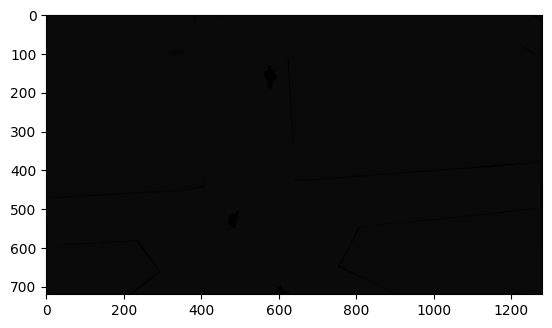

In [18]:
plt.imshow(mask)

In [19]:
# Custom Class for creating training and validation (segmentation) dataset objects.

class CustomSegDataset(Dataset):
    
    def __init__(self,*,image_size,image_paths,mask_paths = None,num_classes,is_train= False):
        self.image_size = image_size
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.num_classes = num_classes
        self.is_train = is_train
        self.transforms = self.set_transforms()
    
    def __len__(self):
        return len(self.image_paths)
        
    def set_transforms(self):
        transforms = []
         # Augmentation to be applied to the training set.
        if self.is_train:
            transforms.extend([
                A.HorizontalFlip(p=0.5),
                A.VerticalFlip(),
                A.ShiftScaleRotate(scale_limit=0.2, rotate_limit=0,
                                   shift_limit=0.2, p=0.5, border_mode=0),])
        # Preprocess transforms - Normalization and converting to PyTorch tensor format (HWC --> CHW).    
        transforms.extend([
            # The mean and std values are of the IMAGENET dataset and is utilized by every pretrained PyTorch model.
            A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], always_apply=True),

            ToTensorV2() # (H, W, C) --> (C, H, W)
        ])
        
        return A.Compose(transforms)
    
    def loadImage(self,file_path,interpolation=cv2.INTER_NEAREST):
        file = cv2.imread(file_path,cv2.IMREAD_COLOR)[:,:,::-1]
        file = cv2.resize(file,self.image_size,interpolation = interpolation)
        return file
    def __getitem__(self,index):
        # Get image and mask path.
        image_path = self.image_paths[index]
                
        # Load image using opencv and convert image format from BGR to RGB and resize.
        image = self.loadImage(image_path,interpolation=cv2.INTER_CUBIC)
        
        if self.mask_paths is not None: # True for Training and validation set.
            # Get mask path.
            mask_path = self.mask_paths[index]
            # Load mask using opencv and convert image format from BGR to RGB and resize.
            mask = self.loadImage(mask_path,interpolation=cv2.INTER_NEAREST)
           
           # Each value of the singe channel mask represents the pixel's class ID (essentially collapsing the RGB mask into a single channel mask).
           # mask = rgb_to_grayscale(mask)
            # Apply Preprocessing (+ Augmentations) transformations to image-mask pair
            transformed = self.transforms(image = image, mask = mask)
            image,mask = transformed['image'],transformed['mask'].to(torch.long)
            
            return image, mask
        
        else:
            transformed = self.transforms(image = image)
            image = transformed['image']
            return image
            
            
        
    
    

## <font style="color:green">1.2. Visualize dataset [3 Points]</font>

**In this sub-section,  you have to plot a few images and its mask.**

**for example:**

---

<img src="https://www.learnopencv.com/wp-content/uploads/2020/04/c3-w12-data-sample.png">

---

In [20]:
#The color mapping dictionaries below define the maping between class IDs and RGB colors.
id2color = {
    0 : (0,0,0),             #background
    1 : (192, 128, 128),     #Person
    2 : (0, 128,0),          #Bike
    3 : (128,128,128),       #Car
    4 : (128, 0,0),          #Drone
    5 : (0, 0, 128),         #Boat
    6 : (192,0,128),         #Animal
    7 : (192, 0,0),          #Obstacle
    8 : (192, 128, 0),       #Construction
    9 : (0, 64, 0),          #Vegetation
    10: (128, 128, 0),       #Road
    11 : (0, 128, 128)       #sky
       
}

# Reverse id2color mapping.
# Used for converting RGB mask to a single channel (grayscale) representation.
rev_id2color = {value: key for key, value in id2color.items()}

In [21]:

def grayscale_to_rgb(num_arr, color_map = id2color):
    gray_rgb_image = np.squeeze(num_arr)
 
    #collapse H,W dimension
    grayscale_array = gray_rgb_image[:, :, 0]
    
    #get an array of all unique pixels and 'inverse' with indices to the unique array which can be used to reconstruct the original array
    unique_pixels, inverse  = np.unique(grayscale_array, return_inverse = True)
  
    # Map unique grayscale values to RGB colors
    color_map = np.array([color_map.get(int(value), (0,0,0)) for value in unique_pixels])
    # Use the inverse indices to reconstruct the RGB image
    rgb_image = color_map[inverse].reshape(gray_rgb_image.shape)
    return np.float32(rgb_image) / 255.0 # return a floating point array in range [0.0, 1.0]

# Function to overlay a segmentation map on top of an RGB image.
def image_overlay(image,segmented_image):
    alpha = 0.7 #Transparency for the original image.
    beta = 0.7 #Transparency for the segmentation mask.
    gamma = 0.0 # Scalar added to each sum.
    
    segmented_image = cv2.cvtColor(segmented_image, cv2.COLOR_RGB2BGR)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    image = cv2.addWeighted(image, alpha, segmented_image, beta, gamma, image)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return np.clip(image, 0.0, 1.0)

In [22]:
#function below will display the original image, the ground truth mask, and the ground truth mask overlayed on the original image.
def display_image_and_masks(*,images,masks,color_mask = False,color_map = id2color):
    title = ['GT image','GT mask','Overlayed mask']
    for idx in range(images.shape[0]):
        image = images[idx]
        grayscale_mask = masks[idx]
        
        plt.figure(figsize = (12,8))
        
        # Create RGB segmentation map from grayscale segmentation map.
        rgb_gt_mask = grayscale_to_rgb(grayscale_mask)
        
        # Create the overlayed image.
        overlayed_image = image_overlay(image,rgb_gt_mask)
        
        # Plot image, segmentation map and overlayed image.
        plt.subplot(1,3,1)
        plt.title(title[0])
        plt.imshow(image)
        plt.axis('off')
        
        plt.subplot(1, 3, 2)
        plt.title(title[1])
        if color_mask:
            plt.imshow(rgb_gt_mask)
        else:
            plt.imshow(grayscale_mask)
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.title(title[2])
        plt.imshow(overlayed_image)
        plt.axis('off')

        plt.show()
        plt.close()
    return
        

In [23]:
#define the get_dataloader(...) function to generate training and validation data loader objects
def get_dataloader(batch_size = 4, num_workers = 0, pin_memory = False):
    num_classes =  DatasetConfig.NUM_CLASSES
    # OpenCV .resize(..) method accepts new size in format (new_width, new_height).
    IMAGE_SIZE = (DatasetConfig.IMG_WIDTH, DatasetConfig.IMG_HEIGHT)
    #Training image and mask paths train_image_paths,train_mask_paths
    # Validation image and mask paths valid_image_paths,valid_mask_paths
    
    #create training dataset and dataloader
    train_dataset = CustomSegDataset(image_size = IMAGE_SIZE, image_paths = train_image_paths,mask_paths = train_mask_paths,is_train = True, num_classes= num_classes)
    
    train_loader = DataLoader(train_dataset,batch_size = batch_size,num_workers = num_workers,pin_memory = pin_memory,
                                  shuffle = True,drop_last = True)
    
    # Create validation dataset and dataloader.
    valid_dataset = CustomSegDataset(image_size = IMAGE_SIZE, image_paths = valid_image_paths,mask_paths = valid_mask_paths,is_train = False, num_classes= num_classes)
    
    valid_loader = DataLoader(valid_dataset,batch_size = batch_size,num_workers = num_workers,pin_memory = pin_memory,
                                  shuffle = False)
    
    return train_loader, valid_loader

In [24]:
train_loader, valid_loader = get_dataloader(batch_size = InferenceConfig.BATCH_SIZE)

In [25]:
len(valid_loader)


132

Visualize.
In the code cell below, we loop over the first batch in the validation dataset and display the ground truth image, ground truth mask, and the ground truth mask overlayed on the image. The overlay helps us better visualize the segmented classes in the context of the original image.

In [26]:
# This function is used for reversing the Normalization step performed during image preprocessing.
# Note the mean and std values must match the ones used.

def denormalize(tensors, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)):
    for c in range(3):
            tensors[:, c, :, :].mul_(std[c]).add_(mean[c])

    return torch.clamp(tensors, min=0.0, max=1.0)

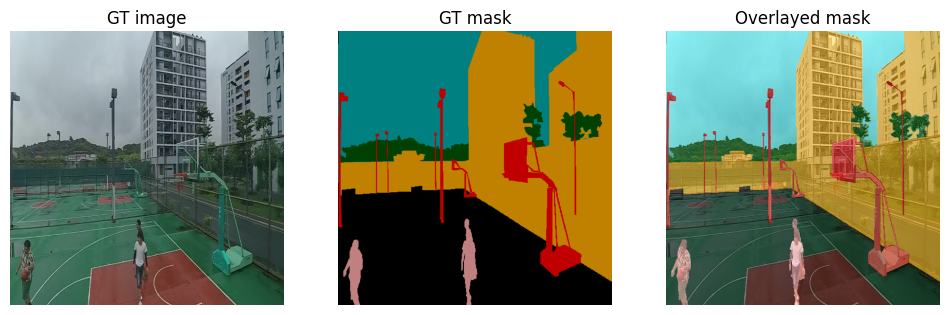

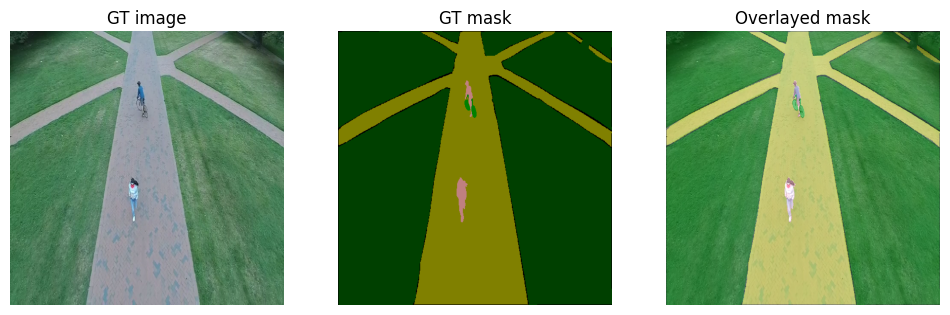

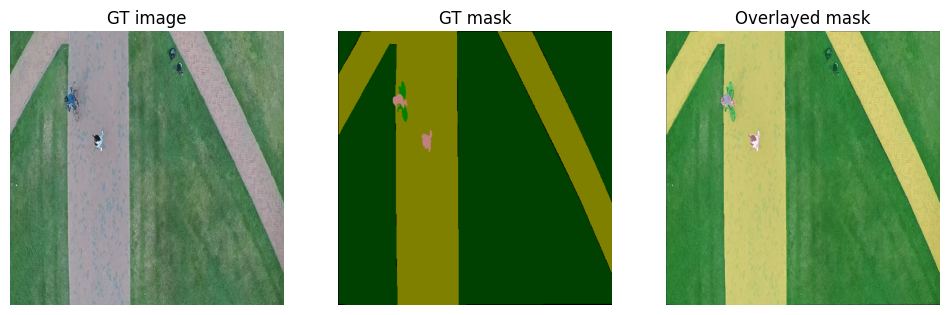

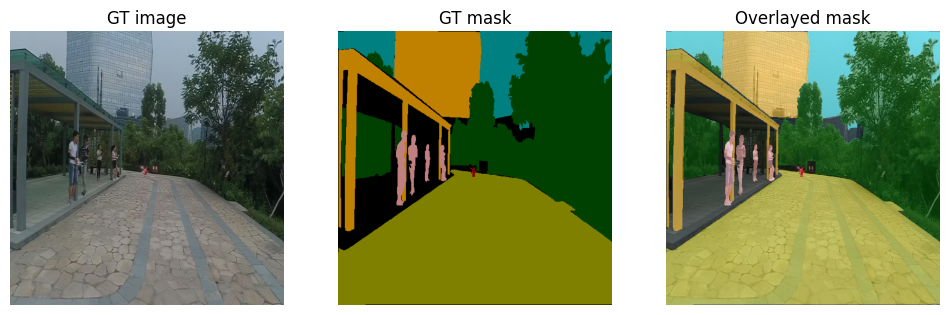

In [27]:
for batch_images,batch_masks in valid_loader:
    batch_images = denormalize(batch_images).permute(0,2,3,1).numpy()
    batch_masks = batch_masks.numpy()
    display_image_and_masks(images=batch_images, masks=batch_masks, color_mask=True)
    break

Let's check the class imbalance in train loader


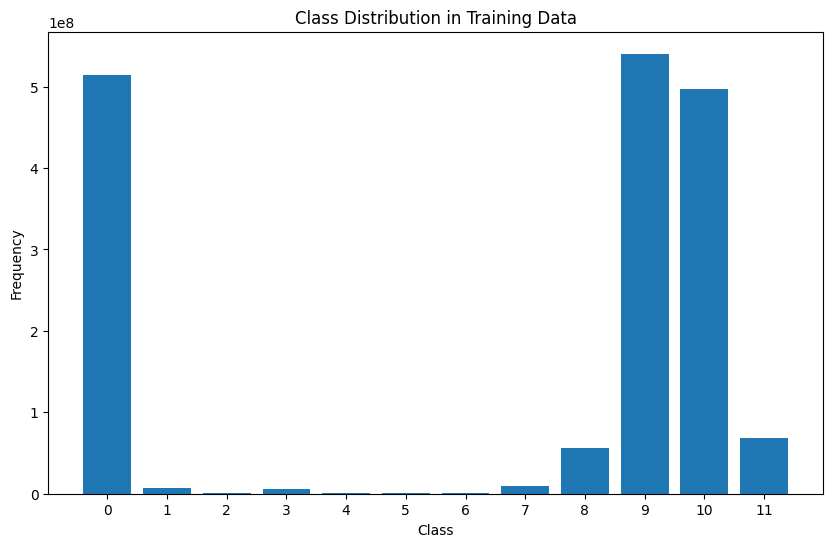

In [165]:

def count_classes(loader, num_classes):
    class_counts = torch.zeros(num_classes)
    for _, targets in loader:
        for c in range(num_classes):
            class_counts[c] += (targets == c).sum().item()
    return class_counts

class_counts = count_classes(train_loader, num_classes=12)

def plot_class_distribution(class_counts):
    plt.figure(figsize=(10, 6))
    plt.bar(range(len(class_counts)), class_counts.numpy(), tick_label=range(len(class_counts)))
    plt.xlabel('Class')
    plt.ylabel('Frequency')
    plt.title('Class Distribution in Training Data')
    plt.show()

plot_class_distribution(class_counts)


the Sum of percentage values in the above analysis is more than 100, which means some images have defects belonging to more than one class.

Number of labels per image

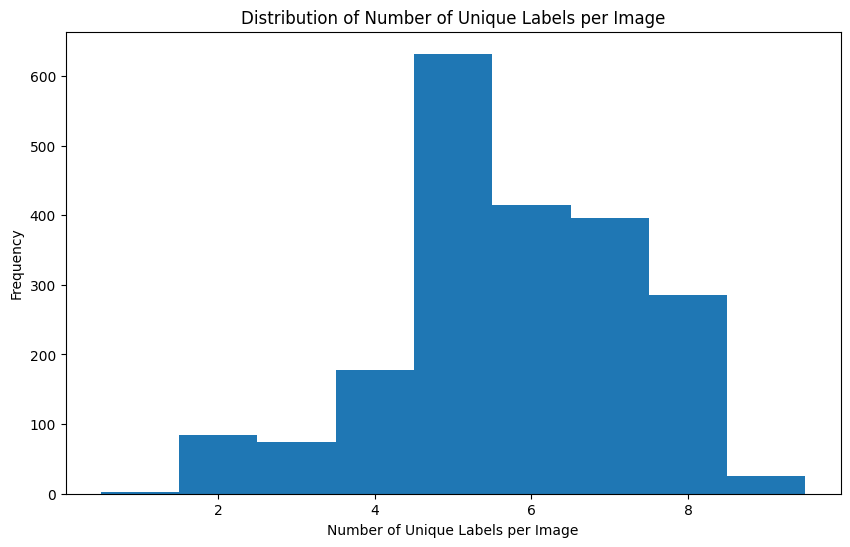

In [166]:
def count_labels_per_image(loader):
    num_labels_per_image = []
    for _, targets in loader:
        for image in targets:
            num_labels_per_image.append(len(torch.unique(image)))
    return num_labels_per_image

def plot_labels_per_image_distribution(num_labels_per_image):
    plt.figure(figsize=(10, 6))
    plt.hist(num_labels_per_image, bins=range(1, max(num_labels_per_image) + 2), align='left')
    plt.xlabel('Number of Unique Labels per Image')
    plt.ylabel('Frequency')
    plt.title('Distribution of Number of Unique Labels per Image')
    plt.show()

num_labels_per_image = count_labels_per_image(train_loader)
plot_labels_per_image_distribution(num_labels_per_image)


# <font style="color:green">2. Evaluation Metrics [10 Points]</font>

<p>This competition is evaluated on the mean <a href='https://en.wikipedia.org/wiki/Sørensen–Dice_coefficient'>Dice coefficient</a
>. The Dice coefficient can be used to compare the pixel-wise agreement between a predicted segmentation and its corresponding ground truth. The formula is given by: </p>

<p>$$DSC =  \frac{2 |X \cap Y|}{|X|+ |Y|}$$
$$ \small \mathrm{where}\ X = Predicted\ Set\ of\ Pixels,\ \ Y = Ground\ Truth $$ </p>
<p>The Dice coefficient is defined to be 1 when both X and Y are empty.</p>

**In this section, you have to implement the dice coefficient evaluation metric.**

In [30]:
def mean_dice(predictions, ground_truths,num_classes,dims = (1,2)):
    # Convert  ground truth masks into one-hot encoded tensor.
    # Shape: [B, H, W] --> [B, H, W, num_classes]
    ground_truths = F.one_hot(ground_truths,num_classes =num_classes)
    # Converting unnormalized predictions into one-hot encoded across channels.
    # Shape: [B, H, W] --> [B, H, W, num_classes]
    predictions = F.one_hot(predictions,num_classes = num_classes)  #.permute(0, 2, 3, 1)
    #intersection |A ∩ B|. Shape: [B, num_classes]
    intersection = (predictions * ground_truths).sum(dim = dims)
    #Summation |A| + |B|. Shape: [B, num_classes].
    summation = predictions.sum(dim = dims) + ground_truths.sum(dim = dims)
    # Dice Shape: (batch_size, num_classes)
    dice = (2*intersection)/summation
    #Requirement: The Dice coefficient is defined to be 1 when both X and Y are empty.
    dice = torch.where(summation == 0, torch.ones_like(dice),dice)
    # As no smoothing is used we replace any 'nan' value that with 0.
    # With smoothing the results yields slightly different values.
    dice = torch.nan_to_num(dice, nan=0.0)
    # Shape: [batch_size,]
    num_classes = torch.count_nonzero(summation,dim = 1)
    # dice per image.
    # Average over the total number of classes present in ground_truths and predictions.
    # Shape: [batch_size,]
    dice = dice.sum(dim = 1) / num_classes
    # Compute the mean over the remaining axes (batch and classes).
    # Shape: Scalar
    dice_mean = dice.mean()
   
    return dice_mean

In [31]:
#Loss function Combo loss Dice + cross entropy loss
def dice_coef_loss(predictions, ground_truths, num_classes=12, dims = (1, 2), smooth=1e-8):
    """
    Calculate a combined loss function comprising the Naive Dice coefficient loss and cross-entropy loss.

    Arguments:
    predictions (torch.tensor): Prediction (P) model output logits.
                                Shape: [batch_size(B), num_classes, height(H), width(W)]

    ground_truths (torch.tensor): Ground truth mask (G). [B, num_classes, H, W].

    dims (tuple): Dimensions corresponding to image height and width in a tensor shape: [B, H, W, num_classes].

    Returns:
    torch.tensor: A scalar tensor representing the combined Naive Mean Dice coefficient and cross-entropy loss.
    """

    # Convert single channel ground truth masks into one-hot encoded tensor.
    # Shape: (B, H, W, num_classes)
    ground_truth_oh = F.one_hot(ground_truths, num_classes=num_classes)
    # Normalize model predictions and transpose.
    # Shape :: [B, num_classes, H, W] --> [B, H, W, num_classes]
    # This is done to match the shape of ground_truth_oh.
    prediction_norm = F.softmax(predictions, dim=1) .permute(0, 2, 3, 1)
  
    # Intersection: |G ∩ P|. Shape: [B, num_classes]
    intersection = (prediction_norm * ground_truth_oh).sum(dim=dims)

    # Summation: |G| + |P|. Shape: [B, num_classes].
    summation = (prediction_norm.sum(dim=dims) + ground_truth_oh.sum(dim=dims))

    # Dice Shape: [B, num_classes]
    dice = (2.0 * intersection + smooth) / (summation + smooth)
    # Replace NaN values with 1 where both prediction and ground truth are empty
    dice = torch.where(summation == 0, torch.ones_like(dice), dice)

    # Compute the mean over the remaining axes (batch and classes).
    dice_mean = dice.mean()

    # Compute cross-entropy loss.
    CE = F.cross_entropy(predictions, ground_truths)

    return (1.0 - dice_mean) + CE

In [32]:
def iou_loss(predictions, ground_truths, num_classes=12, dims = (1, 2), smooth=1e-8):
    """
    Naive IoU + Cross-entropy loss function.

    Arguments:
    predictions (torch.tensor): Prediction (P) model output logits.
                                Shape: [batch_size(B), num_classes, height(H), width(W)]

    ground_truths (torch.tensor): Ground truth mask (G). [B, num_classes, H, W].

    dims (tuple): Dimensions corresponding to image height and width in a tensor shape: [B, H, W, num_classes].

    Returns:
    torch.tensor: A scalar tensor representing the combined Naive Mean IoU and cross-entropy loss.
    """

    # Convert single channel ground truth masks into one-hot encoded tensor.
    # Shape: (B, H, W, num_classes)
    ground_truth_oh = F.one_hot(ground_truths, num_classes=num_classes)
    
    # Normalize model predictions and transpose.
    # Shape :: [B, num_classes, H, W] --> [B, H, W, num_classes]
    # This is done to match the shape of ground_truth_oh.
    prediction_norm = F.softmax(predictions, dim=1).permute(0, 2, 3, 1)

    # Intersection: |G ∩ P|. Shape: [B, num_classes]
    intersection = (prediction_norm * ground_truth_oh).sum(dim=dims)

    # Summation: |G| + |P|. Shape: [B, num_classes].
    summation = (prediction_norm.sum(dim=dims) + ground_truth_oh.sum(dim=dims))

    # Union. Shape: [B, num_classes]
    union = summation - intersection

    # IoU Shape: [B, num_classes]
    iou = (intersection + smooth) / (union + smooth)

    # Compute the mean over the remaining axes (batch and classes). Shape: Scalar
    iou_mean = iou.mean()

    # Compute cross-entropy loss.
    CE = F.cross_entropy(predictions, ground_truths)

    return (1.0 - iou_mean) + CE

# <font style="color:green">3. Model [10 Points]</font>

**In this section, you have to define your model.**

In [33]:
# Get a list of all available models
model_names = sorted(name for name in segmentation.__dict__)
#     if name.islower() and not name.startswith("__")
#     and callable(models.__dict__[name]))

# Print the list of available models
print(model_names)

['DeepLabV3', 'DeepLabV3_MobileNet_V3_Large_Weights', 'DeepLabV3_ResNet101_Weights', 'DeepLabV3_ResNet50_Weights', 'FCN', 'FCN_ResNet101_Weights', 'FCN_ResNet50_Weights', 'LRASPP', 'LRASPP_MobileNet_V3_Large_Weights', '__builtins__', '__cached__', '__doc__', '__file__', '__loader__', '__name__', '__package__', '__path__', '__spec__', '_utils', 'deeplabv3', 'deeplabv3_mobilenet_v3_large', 'deeplabv3_resnet101', 'deeplabv3_resnet50', 'fcn', 'fcn_resnet101', 'fcn_resnet50', 'lraspp', 'lraspp_mobilenet_v3_large']


In [34]:
def load_model(model_name: str):
    if model_name.lower() not in ("mobilenet", "resnet_50", "resnet_101"):
        raise ValueError("'model_name' should be one of ('mobilenet', 'resnet_50', 'resnet_101')")
        
    if model_name == "resnet_50":
        model = deeplabv3_resnet50(weights=DeepLabV3_ResNet50_Weights.DEFAULT)
        transforms = DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1.transforms()

    elif model_name == "resnet_101":
        model = deeplabv3_resnet101(weights=DeepLabV3_ResNet101_Weights.DEFAULT)
        transforms = DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1.transforms()
    
    else:
        model = deeplabv3_mobilenet_v3_large(weights=DeepLabV3_MobileNet_V3_Large_Weights.DEFAULT)
        transforms = DeepLabV3_MobileNet_V3_Large_Weights.COCO_WITH_VOC_LABELS_V1.transforms()
    

     
    model.classifier[-1] = nn.LazyConv2d(out_channels = DatasetConfig.NUM_CLASSES,kernel_size = (1,1),stride = 1)
#     for param in model.classifier[1:].parameters():
#         param.requires_grad = True
    model.aux_classifier[-1] = nn.LazyConv2d(out_channels=DatasetConfig.NUM_CLASSES, kernel_size=1, stride=1)
    model.eval()

    # Warmup run
    
    _ = model(torch.randn(1, 3, 520, 520))
    print(summary(model, input_size=(1, 3, DatasetConfig.IMG_HEIGHT, DatasetConfig.IMG_WIDTH)))
    
    return model, transforms

In [35]:
model,transforms = load_model('resnet_101')

Downloading: "https://download.pytorch.org/models/deeplabv3_resnet101_coco-586e9e4e.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet101_coco-586e9e4e.pth
100%|██████████| 233M/233M [00:01<00:00, 145MB/s]  


Layer (type:depth-idx)                             Output Shape              Param #
DeepLabV3                                          [1, 12, 520, 520]         --
├─IntermediateLayerGetter: 1-1                     [1, 2048, 65, 65]         --
│    └─Conv2d: 2-1                                 [1, 64, 260, 260]         9,408
│    └─BatchNorm2d: 2-2                            [1, 64, 260, 260]         128
│    └─ReLU: 2-3                                   [1, 64, 260, 260]         --
│    └─MaxPool2d: 2-4                              [1, 64, 130, 130]         --
│    └─Sequential: 2-5                             [1, 256, 130, 130]        --
│    │    └─Bottleneck: 3-1                        [1, 256, 130, 130]        75,008
│    │    └─Bottleneck: 3-2                        [1, 256, 130, 130]        70,400
│    │    └─Bottleneck: 3-3                        [1, 256, 130, 130]        70,400
│    └─Sequential: 2-6                             [1, 512, 65, 65]          --
│    │    └─Bottlen

In [36]:
transforms

SemanticSegmentation(
    resize_size=[520]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

# <font style="color:green">4. Train & Inference</font>

- **In this section, you have to train the model and infer on sample data.**


- **You can write your trainer class in this section.**


- **If you are using any loss function other than PyTorch standard loss function, you have to define in this section.**


- **This section should also have optimizer and LR-schedular (if using) details.**



## <font style="color:green">4.1. Train [7 Points]</font>

**Write your training code in this sub-section.**


**This section must contain training plots (use matplotlib or share tensorboard.dev scalars logs).**

**You must have to plot the following:**
- **train loss**


- **validation loss**


- **IoU for all twelve classes (0-11) and the mean IoU of all classes on validatin data.** 

**an example of matplotlib plot:**

---

<img src='https://www.learnopencv.com/wp-content/uploads/2020/04/c3-w12-train-loss.png'>

---

<img src='https://www.learnopencv.com/wp-content/uploads/2020/04/c3-w12-val-loss.png'>

---

<img src='https://www.learnopencv.com/wp-content/uploads/2020/04/c3-w12-mean_iou.png'>

---

<img src='https://www.learnopencv.com/wp-content/uploads/2020/04/c3-w12-iou-0.png'>

---

<center>*</center>
<center>*</center>
<center>*</center>

---

<img src='https://www.learnopencv.com/wp-content/uploads/2020/04/c3-w12-iou-11.png'>

---


The train_model(...) method has been used to handle the model outputs and calculate the loss. The loss function used for the main branch is dice_coeff_loss(...), and we use a simple Cross-entropy loss for the auxiliary branch. There are no restrictions as to which loss should be for the auxiliary branch.

The metric functions dice coefficient loss.

When using Torchvision models, we need to make a small change to access the outputs from the forward pass. The forward pass of the model returns a dictionary containing two keys, out & aux. The out key holds the output from the main branch path of the model, while the aux key holds the output from the auxiliary branch.

The validate(...) function remains almost unchanged except for the method to access the model outputs. As the auxiliary is not used during inference, the loss is calculated only on outputs of the main branch.

In [164]:
from typing import Union

@dataclass
class ModelConfig:
    MODEL_NAME:             str = "deeplabv3_resnet101"
    USE_PRETRAINED:        bool = True
    AUX_LOSS: Union[bool, None] = True # True, None
    AUX_WEIGHT:           float = 0.5

In [38]:
def train_one_epoch(model, loader, optimizer, scaler, num_classes, device= 'cpu', epochs_idx =0 , total_epochs=80):
    model.train()
    loss_record = MeanMetric()
    metric_record  = MeanMetric()
    acc_record = MulticlassAccuracy(num_classes = num_classes, average = 'micro')
    
    loader_len = len(loader)
    
    with tqdm(total = loader_len, ncols = 122) as tq:
        tq.set_description(f"Train :: Epoch: {epochs_idx}/{total_epochs}")
        
        for data,mask in loader:
            tq.update(1)
            #send data and mask to GPU if available
            data,mask = data.to(device), mask.to(device)
            #collapse H,W dimension
            mask = mask[:, :,:, 0]
            #reset parameter gradients to zero
            optimizer.zero_grad()
            # Autocasting for mixed-precision training.
            with amp.autocast():
                #perform forward pass through the model. Output is a dictionary
                output_dict = model(data)
                # Classifier head output
                cls_out = output_dict['out']
               # Calculate Combo loss (Segmentation specific loss (Dice) + cross entropy)
                loss = dice_coef_loss(cls_out, mask, num_classes=num_classes)
                # Auxiliary head output
                aux_out = output_dict['aux']
                # Calculate simple cross entropy loss for auxiliary head output.
                aux_loss = dice_coef_loss(aux_out,mask,num_classes=num_classes)
                # A weighted combination between classifier and auxiliary head loss.
                loss += ModelConfig.AUX_WEIGHT * aux_loss
            # Calculate gradients w.r.t training parameters on scaled loss.
            scaler.scale(loss).backward()
            # Update parameters using gradients
            scaler.step(optimizer)
            # Updates the scale for the next iteration.
            scaler.update()
            # Detach Classifier head output logits tensor from graph.
            #Detaching a tensor from the computation graph in PyTorch means that you're creating a new tensor t
            #hat shares the same data as the original tensor but doesn't require gradients. 
            cls_out = cls_out.detach()
            # Get the index across channel axis of the max logit score.
            # We can directly call argmax because: Softmax(logit).argmax() == logit.argmax()
            pred_idx = cls_out.argmax(dim = 1)
            # Calculate Segmentation specific metric (Dice).
            metric = mean_dice(pred_idx, mask, num_classes)
            # Record and calculate batch accuracy using torchmetrics.
            acc_record.update(pred_idx.cpu(), mask.cpu())
            # Record loss and Dice metric.
            loss_record.update(loss.detach().cpu(), weight=data.shape[0])
            metric_record.update(metric.cpu(),weight=data.shape[0])
            # Update progress bar description.
            tq.set_postfix_str(s=f"Loss: {loss_record.compute():.4f}, Dice: {metric_record.compute():.4f}, Acc: {acc_record.compute():.4f}")
            # Free up memory
            del data, mask, output_dict, cls_out, pred_idx, metric
            torch.cuda.empty_cache()
    # Get mean loss, accuracy and Dice score.
    epoch_loss   = loss_record.compute()
    epoch_metric = metric_record.compute()
    epoch_acc    = acc_record.compute()
    return epoch_loss, epoch_metric, epoch_acc

In [39]:
def validation(model, loader, num_classes, device= 'cpu', epochs_idx=0 , total_epochs=80):
    model.eval()
    loss_record = MeanMetric()
    metric_record  = MeanMetric()
    acc_record = MulticlassAccuracy(num_classes = num_classes, average = 'micro')
    
    loader_len = len(loader)
    
    with tqdm(total = loader_len, ncols = 122) as tq:
        tq.set_description(f"Train :: Epoch: {epochs_idx}/{total_epochs}")
        
        for data,mask in loader:
            tq.update(1)
            #send data and mask to GPU if available
            data,mask = data.to(device), mask.to(device)
            #collapse H,W dimension
            mask = mask[:, :,:, 0]
            with torch.no_grad():
                #perform forward pass through the model. Output is a dictionary
                output_dict = model(data)
                # Classifier head output
                cls_out = output_dict['out']
                # Calculate Combo loss (Segmentation specific loss (Dice) + cross entropy)
                loss = dice_coef_loss(cls_out, mask, num_classes=num_classes)

            # Get the index across channel axis of the max logit score.
            # We can directly call argmax because: Softmax(logit).argmax() == logit.argmax()
            pred_idx = cls_out.argmax(dim = 1)
            # Calculate Segmentation specific metric (Dice).
            metric = mean_dice(pred_idx, mask, num_classes)
            # Record and calculate batch accuracy using torchmetrics.
            acc_record.update(pred_idx.cpu(), mask.cpu())
            # Record loss and Dice metric.
            loss_record.update(loss.detach().cpu(), weight=data.shape[0])
            metric_record.update(metric.cpu(),weight=data.shape[0])
            # Free up memory
            del data, mask, output_dict, cls_out, pred_idx, metric
            torch.cuda.empty_cache()
            
        # Get mean loss, accuracy and Dice score.
        valid_epoch_loss   = loss_record.compute()
        valid_epoch_metric = metric_record.compute()
        valid_epoch_acc    = acc_record.compute()
        # Update progress bar description.
        tq.set_postfix_str(s=f"Loss: {valid_epoch_loss:.4f}, Dice: {valid_epoch_metric:.4f}, Acc: {valid_epoch_acc:.4f}")
    return valid_epoch_loss, valid_epoch_metric, valid_epoch_acc

In [40]:
#Main Function for Training
def main(*, model, optimizer, ckpt_dir, pin_memory=False, device="cpu"):
    # Create Dataloader.
    train_loader,valid_loader = get_dataloader(batch_size=TrainingConfig.BATCH_SIZE, pin_memory=pin_memory,
                                                num_workers=TrainingConfig.NUM_WORKERS)
    
    # Save the model if best_loss improves.
    best_loss = float("inf")
    # Plot training and validation epoch logs and
    # prints min, max, current stats of all variable being tracked.
    live_plot = PlotLosses(outputs=[MatplotlibPlot(cell_size=(8, 3)), ExtremaPrinter()])
    total_epochs = TrainingConfig.EPOCHS
    # Creates a GradScaler once at the beginning of training
    # for automatic mixed precision training.
    scaler = amp.GradScaler()
    
    # Early stopping parameters
    patience = 10  # Number of epochs to wait for improvement
    patience_counter = 0
    #Training loop
    for epoch in range(total_epochs+1):
        # Memory Cleanup.
        torch.cuda.empty_cache()
        gc.collect()
        #train one epoch
        train_loss, train_metric, train_accuracy = train_one_epoch(model = model, loader = train_loader, optimizer = optimizer, scaler = scaler,
                                                                  num_classes = DatasetConfig.NUM_CLASSES,device = device,epochs_idx = epoch,total_epochs = total_epochs )
        # Peform model validation.
        valid_loss, valid_metric, valid_accuracy = validation(model = model, loader = valid_loader, device = device, num_classes = DatasetConfig.NUM_CLASSES,
                                                              epochs_idx = epoch,total_epochs = total_epochs )
        
        # Plot train and validation statistics.
        live_plot.update({
                "loss": train_loss,
                "val_loss": valid_loss,
                "accuracy": train_accuracy,
                "val_accuracy": valid_accuracy,
                "Dice": train_metric,
                "val_IoU": valid_metric,
        })

        live_plot.send()
        
        # Create model and optimizer checkpoint.
        if valid_loss < best_loss:
            best_loss = valid_loss
            print("Model Improved. Saving...", end="")

            checkpoint_dict = {
                "opt": optimizer.state_dict(),
                "model": model.state_dict(),
                "scaler": scaler.state_dict(),
            }
            torch.save(checkpoint_dict, os.path.join(ckpt_dir, "ckpt.tar"))
            del checkpoint_dict
            print("Done.\n")
            
        else:
            patience_counter += 1
            print(f"No improvement. Patience counter: {patience_counter}/{patience}")
            
        # Check for early stopping
        if patience_counter >= patience:
            print("Early stopping triggered. Stopping training.")
            break
            
    return

Model Checkpoint Helper Function

In the following code cell, we define a new function, create_checkpoint_dir(...). This function creates a new directory for the current training model checkpoint to be saved. This will ensure that the previous training checkpoints are not overwritten.

In [41]:
def create_checkpoint_dir(checkpoint_dir):
    # Create a new checkpoint directory every time.
    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)

    try:
        num_versions = [int(i.split("_")[-1]) for i in os.listdir(checkpoint_dir) if "version" in i]
        version_num = max(num_versions) + 1
    except:
        version_num = 0

    version_dir = os.path.join(checkpoint_dir, "version_" + str(version_num))
    os.makedirs(version_dir)

    print(f"Checkpoint directory: {version_dir}")
    return version_dir

Train the Model

In [42]:
# For deterministic training
seed_everything(seed_value=41)

# Set default device to GPU if available.
DEVICE, GPU_AVAILABLE = get_default_device()
# Setup Model Checkpoint directory.
CKPT_DIR = create_checkpoint_dir(TrainingConfig.CHECKPOINT_DIR)
# Send model to device (GPU/CPU)
model.to(DEVICE)
# Dummy pass through the model to initalize parameters.
_ = model(torch.randn((2, 3, DatasetConfig.IMG_HEIGHT, DatasetConfig.IMG_WIDTH), device=DEVICE))
# Initialize Optimizer
optimizer = Adam(
    model.parameters(),
    lr=TrainingConfig.LEARNING_RATE,
    amsgrad=True,
    fused=True,
)


Checkpoint directory: model_checkpoint/DeepLabv3_AeroScapes_Dice_loss/version_0


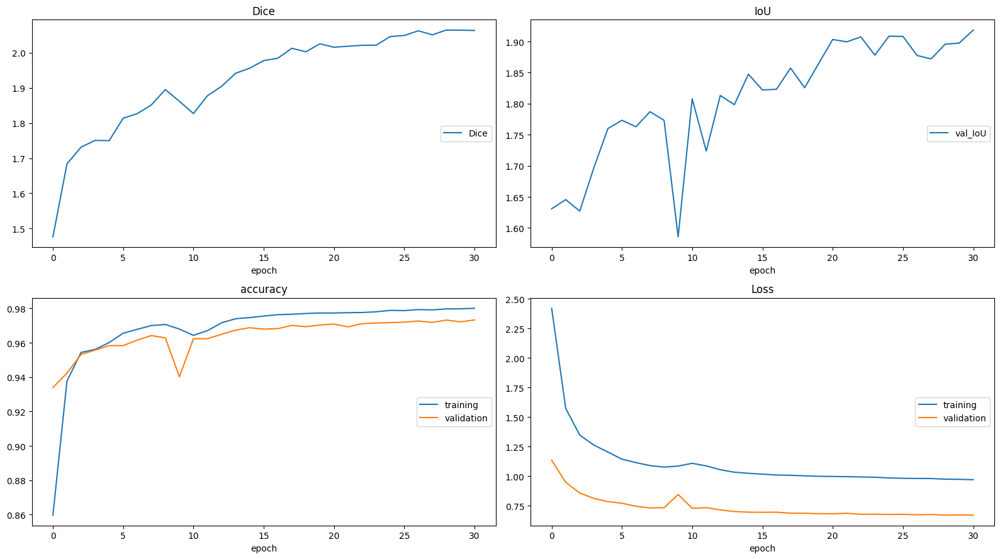

Dice
	Dice             	 (min:    1.476, max:    2.064, cur:    2.063)
IoU
	val_IoU          	 (min:    1.586, max:    1.918, cur:    1.918)
accuracy
	training         	 (min:    0.860, max:    0.980, cur:    0.980)
	validation       	 (min:    0.934, max:    0.973, cur:    0.973)
Loss
	training         	 (min:    0.971, max:    2.420, cur:    0.971)
	validation       	 (min:    0.671, max:    1.135, cur:    0.671)
Model Improved. Saving...Done.



In [43]:
main(
    model=model,
    optimizer=optimizer,
    ckpt_dir=CKPT_DIR,
    device=DEVICE,
    pin_memory=GPU_AVAILABLE,
)

## <font style="color:green">4.2. Inference [3 Points]</font>

**Plot some sample inference in this sub-section.**

**for example:**

---

<img src='https://www.learnopencv.com/wp-content/uploads/2020/04/c3-w12-sample-predtiction.png'>

---



sample inference
For inference, we will use the same validation data as we did during training. We will plot the ground truth images, the ground truth masks, and the predicted segmentation maps overlayed on the ground truth images.

In [44]:
import os
for dirname, _, filenames in os.walk('/kaggle/working'):
   # print(filenames)
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/working/model_checkpoint/DeepLabv3_AeroScapes_Dice_loss/version_0/ckpt.tar


In [45]:
#trained_model = model.load_state_dict(torch.load(os.path.join(CKPT_DIR, "ckpt.tar"), map_location='cpu')['model'])
checkpoint = torch.load(os.path.join(CKPT_DIR, "ckpt.tar"), map_location='cpu')
model.load_state_dict(checkpoint['model'])
model.to(DEVICE)
model.eval()

DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

In [46]:
# Function to convert a single channel mask representation to an RGB mask.
def num_to_rgb(num_arr, color_map=id2color):
    single_layer = np.squeeze(num_arr)
    output = np.zeros(num_arr.shape[:2] + (3,))

    for k in color_map.keys():
        output[single_layer == k] = color_map[k]

    return np.float32(output) / 255.0 # return a floating point array in range [0.0, 1.0]

In [47]:
@torch.inference_mode()
def inference(model, loader, device="cpu"):
    num_batches_to_process = InferenceConfig.NUM_BATCHES

    for idx, (batch_img, batch_mask) in enumerate(loader):
        pred_all = model(batch_img.to(device))['out']
        pred_all = pred_all.cpu().argmax(dim=1).numpy()

        batch_img = denormalize(batch_img.cpu()).permute(0, 2, 3, 1).numpy()

        if idx == num_batches_to_process:
            break

        for i in range(0, len(batch_img)):
            fig = plt.figure(figsize=(20, 8))

            # Display the original image.
            ax1 = fig.add_subplot(1, 4, 1)
            ax1.imshow(batch_img[i])
            ax1.title.set_text("Actual frame")
            plt.axis("off")

            # Display the ground truth mask.
            true_mask_rgb = grayscale_to_rgb(batch_mask[i], color_map=id2color)
            ax2 = fig.add_subplot(1, 4, 2)
            ax2.set_title("Ground truth labels")
            ax2.imshow(true_mask_rgb)
            plt.axis("off")

            # Display the predicted segmentation mask.
           #print(pred_all)
            pred_mask_rgb = num_to_rgb(pred_all[i], color_map=id2color)
            ax3 = fig.add_subplot(1, 4, 3)
            ax3.set_title("Predicted labels")
            ax3.imshow(pred_mask_rgb)
            plt.axis("off")

            # Display the predicted segmentation mask overlayed on the original image.
            overlayed_image = image_overlay(batch_img[i], pred_mask_rgb)
            ax4 = fig.add_subplot(1, 4, 4)
            ax4.set_title("Overlayed image")
            ax4.imshow(overlayed_image)
            plt.axis("off")

            plt.show()
         # Free up memory
        del batch_img, batch_mask, pred_all
        
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

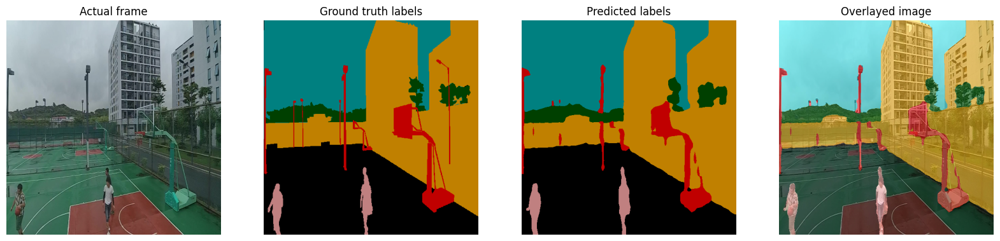

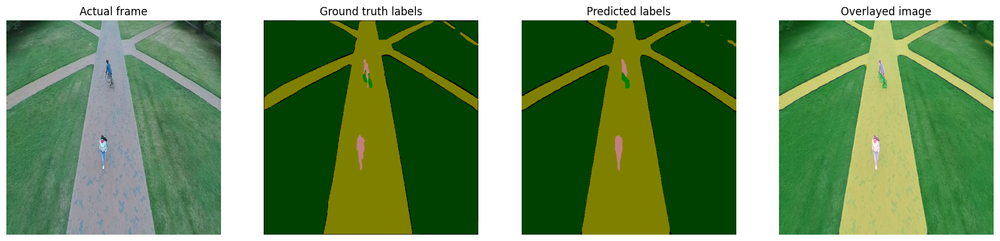

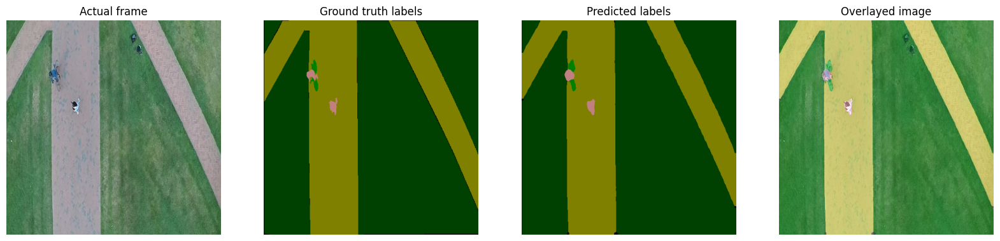

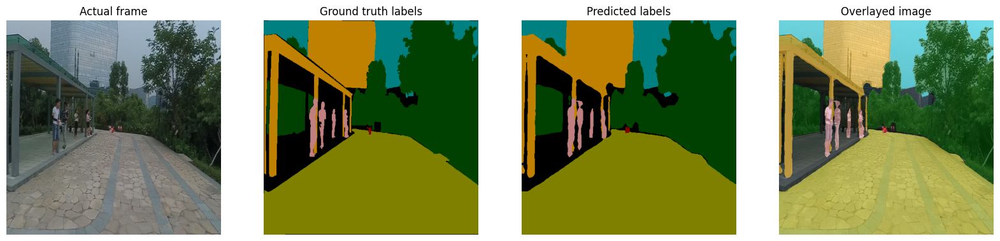

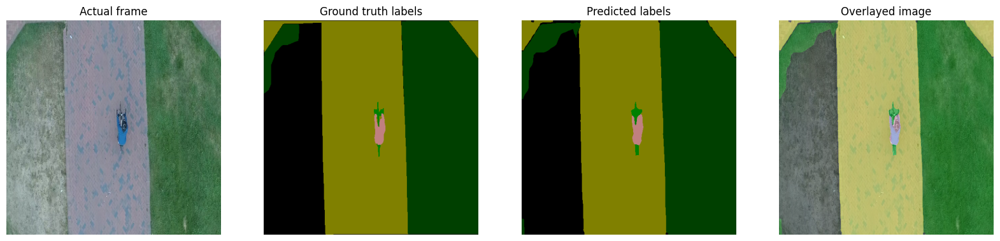

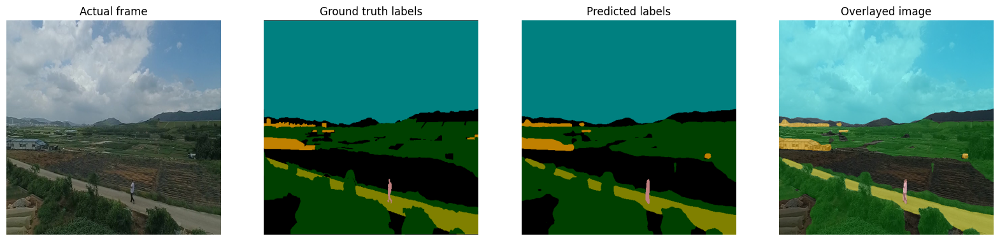

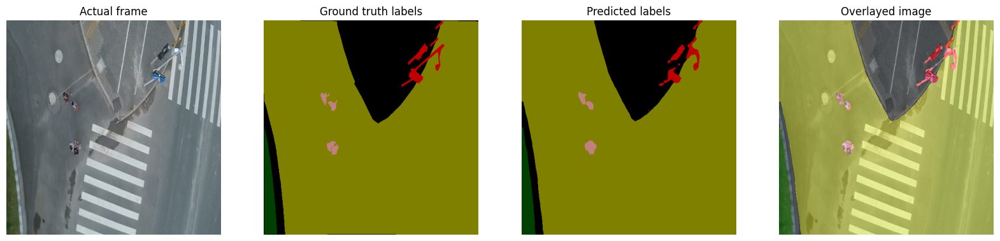

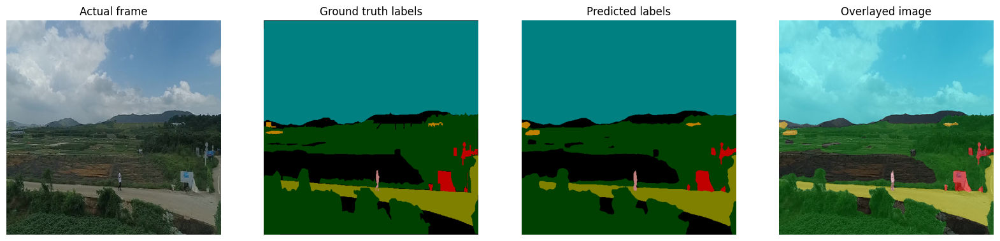

In [48]:
inference(model, valid_loader, device=DEVICE)

# <font style="color:green">5. Prepare Submission CSV [10 Points]</font>

**Write your code to prepare the submission CSV file.**


**Note that in the submission file, you have to write Encoded Pixels.**

[Here is a blog to understand what is Encoded Pixels.](https://medium.com/analytics-vidhya/generating-masks-from-encoded-pixels-semantic-segmentation-18635e834ad0)

In [49]:
test_path = os.path.join(root_dir,'test.csv')
test_df = pd.read_csv(test_path)
image_path

'/kaggle/input/opencv-pytorch-segmentation-project/imgs/imgs/'

In [50]:
test_images,_ = get_images_masks(image_path, mask_path = None, df = test_df)

In [51]:
image = cv2.imread(test_images[100])
print(image.shape)

(720, 1280, 3)


In [52]:
len(test_images)

648

In [53]:
#define the get_dataloader(...) function to generate training and validation data loader objects
def get_testloader(batch_size = 1, num_workers = TrainingConfig.NUM_WORKERS, pin_memory = False):
    num_classes =  DatasetConfig.NUM_CLASSES
    # OpenCV .resize(..) method accepts new size in format (new_width, new_height).
    IMAGE_SIZE = (DatasetConfig.IMG_WIDTH, DatasetConfig.IMG_HEIGHT)
    #Training image and mask paths train_image_paths,train_mask_paths
    # Validation image and mask paths valid_image_paths,valid_mask_paths
    
    #create test dataset and dataloader
    test_dataset = CustomSegDataset(image_size = IMAGE_SIZE, image_paths = test_images,mask_paths = None,is_train = False, num_classes= num_classes)
    
    test_loader = DataLoader(test_dataset,batch_size = batch_size,num_workers = num_workers,pin_memory = pin_memory,
                                  shuffle = False)
    
    return test_loader

In [54]:
test_loader = get_testloader()

In [55]:
len(test_loader)

648

In [56]:
test_df.iloc[0]['ImageID']

9743172603816335085

In [151]:
from PIL import Image
@torch.inference_mode()
def inference(model, loader, device="cpu"):
    count = 0
    result = []
    
    for idx, batch_img in enumerate(loader):
        pred_all = model(batch_img.to(device))['out']
        pred_all = pred_all.cpu().argmax(dim=1).numpy()
        image_id = test_df.iloc[idx]['ImageID']
        
        for i in range(pred_all.shape[0]):
            
            resized_mask = resize_mask(pred_all[i], (1280,720))
            rle = masks2rles(resized_mask,image_id,num_classes = 12,)
            for cls_image_id, encoded_string in rle.items():
                result.append({"ImageID": cls_image_id, "EncodedPixels": encoded_string if encoded_string else ""})
           # rle_dict = rle
#         data = {
#             "IMG_ID" : image_id,
#             "EncodedString": rle
#             }
        #result.append(rle)
        
        batch_img = denormalize(batch_img.cpu()).permute(0, 2, 3, 1).numpy()
        
        if count<10:
            count+=1
            for i in range(0, len(batch_img)):
                fig = plt.figure(figsize=(20, 8))

                # Display the original image.
                ax1 = fig.add_subplot(1, 3, 1)
                ax1.imshow(batch_img[i])
                ax1.title.set_text("Actual frame")
                plt.axis("off")

                # Display the predicted segmentation mask.
                pred_mask_rgb = num_to_rgb(pred_all[i], color_map=id2color)
                ax3 = fig.add_subplot(1, 3, 2)
                ax3.set_title("Predicted labels")
                ax3.imshow(pred_mask_rgb)
                plt.axis("off")

                # Display the predicted segmentation mask overlayed on the original image.
                overlayed_image = image_overlay(batch_img[i], pred_mask_rgb)
                ax4 = fig.add_subplot(1, 3, 3)
                ax4.set_title("Overlayed image")
                ax4.imshow(overlayed_image)
                plt.axis("off")

                plt.show()
             # Free up memory
        del batch_img, pred_all,rle
        
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
    return result

To generate the Run-Length Encoding (RLE) for a multi-class prediction mask (i.e., not binary), you'll need to create RLE strings for each class separately. Each class in the mask will have its own RLE string.

# to convert masks to run length encoded values
def mask2rle(img):
    '''
    img: numpy array containing ones and zeros as pixel values, 1 - mask, 0 - background
    Returns String run length ecoded pixels 
    '''
    pixels= img.T.flatten() # Convert nd-array to 1d-array (numbering of pixels is from top to bottom)
    pixels = np.concatenate([[0], pixels, [0]]) # Adding zeros at the start and end so that if there's mask at the first/last pixel, it gets detected.
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1 # Detect all changing pixels (where pixel values changes, either 0 -> 1 or 1 -> 0)
    
    # To get RLE, we need start pixels and run lengths
    # Start pixels are the pixels where change 0 -> 1 occurs, i.e. pixels at even indices
    # Run length is the pixel distance between two consecutive changing pixels. So, run lengths = odd indices - even indices
    runs[1::2] -= runs[::2] 

    return ' '.join(str(x) for x in runs)

In [110]:
import numpy as np

def resize_mask(mask, original_size):
    """
    Resize the mask to the original image size.
    """
    mask_image = Image.fromarray(mask.astype(np.uint8))
      
    #print(mask_image.size)
    resized_mask = mask_image.resize(original_size, Image.NEAREST)
    #print(resized_mask.size)
    return np.array(resized_mask)


def masks2rles(masks,image_id, num_classes,):
    '''
    masks: numpy array of shape (batch_size, height, width) with integer class values (0, 1, 2, ..., num_classes-1)
    num_classes: the number of classes in the mask
    Returns a list of dictionaries, each containing class ids as keys and RLE strings as values for each mask
    '''
    rle_dict = {}
    for cls in range(num_classes):
        cls_image_id = f"{image_id}_{cls}"
        cls_mask = (masks == cls).astype(np.uint8)
        rle = ''
        pixels = cls_mask.flatten()
        # We add a zero at the beginning and end to ensure the RLE encoding captures the edges correctly
        pixels = np.concatenate([[0], pixels, [0]])
        #Find Run Start and End Points. Find where the pixel value changes
        runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
         # Adjust run lengths
        #  runs[::2] selects every other element starting from the first, i.e., [2, 7] (start positions).
        #runs[1::2] selects every other element starting from the second, i.e., [5, 9] (end positions).
        #Subtraction runs[1::2] -= runs[::2] changes the end positions to lengths
        runs[1::2] -= runs[::2]
        # Convert to string format 
        rle = ' '.join(str(x) for x in runs)
#         rle_dict['IMG_ID'] = cls_image_id
#         rle_dict['EncodedString']=rle
        rle_dict[cls_image_id] = rle
    
    return rle_dict



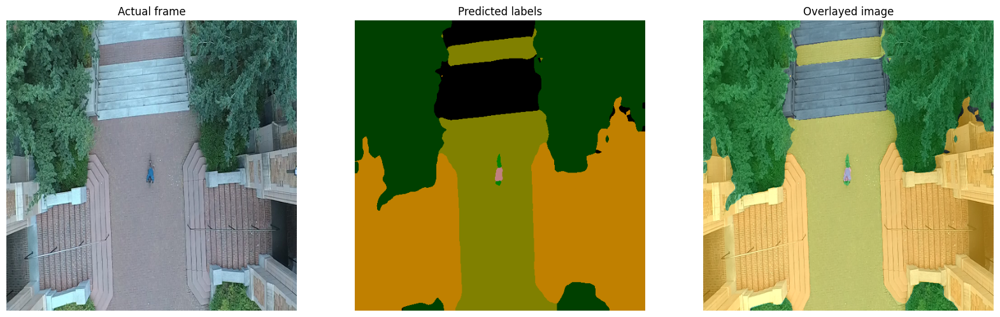

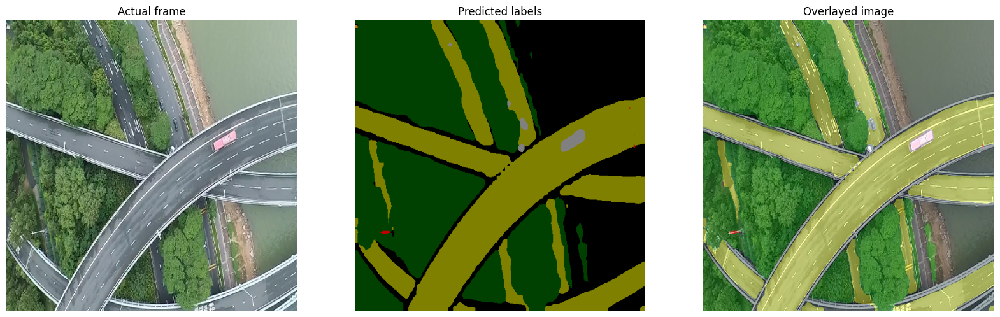

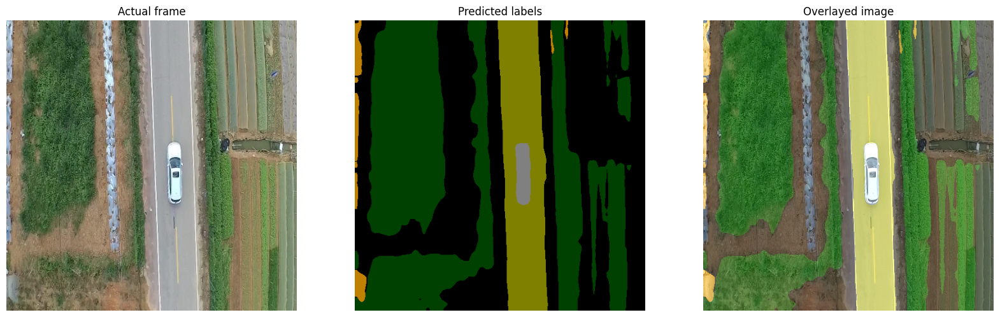

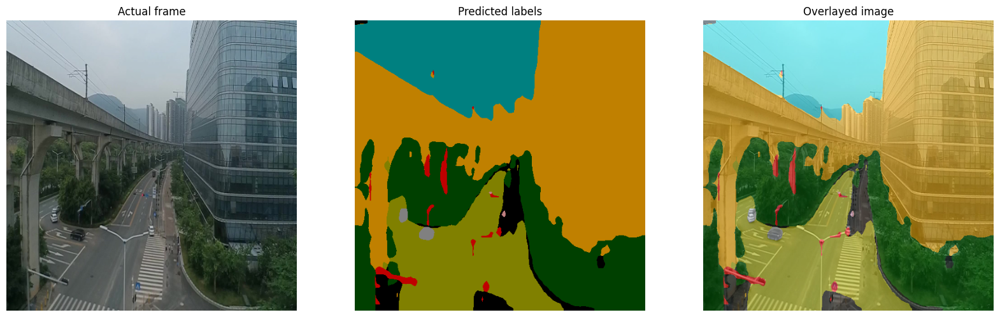

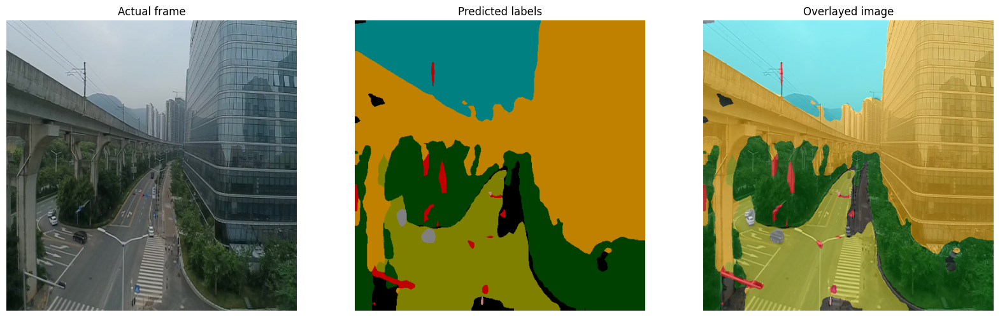

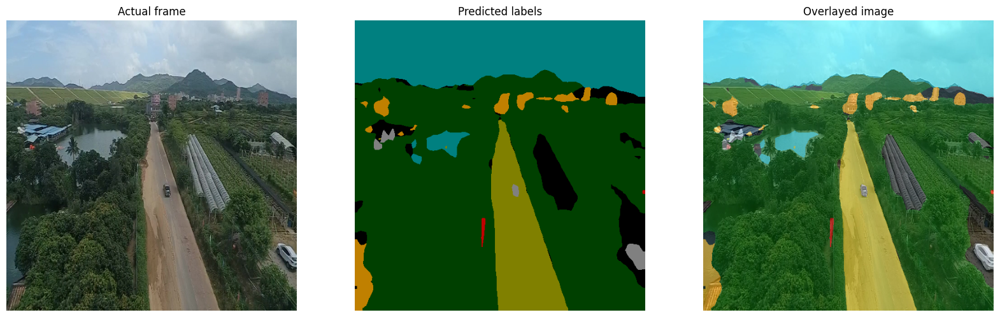

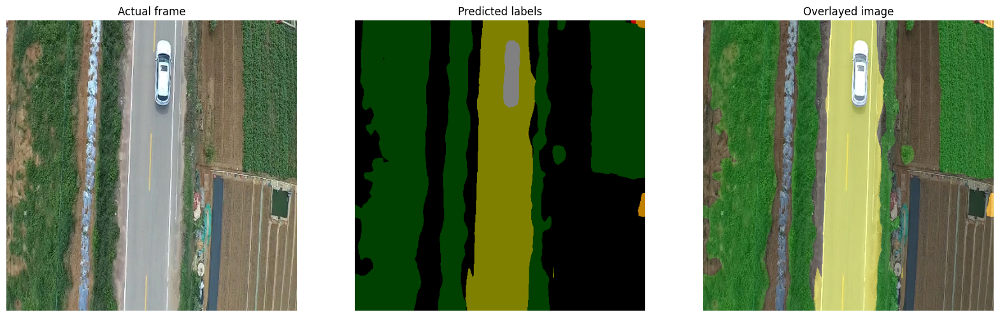

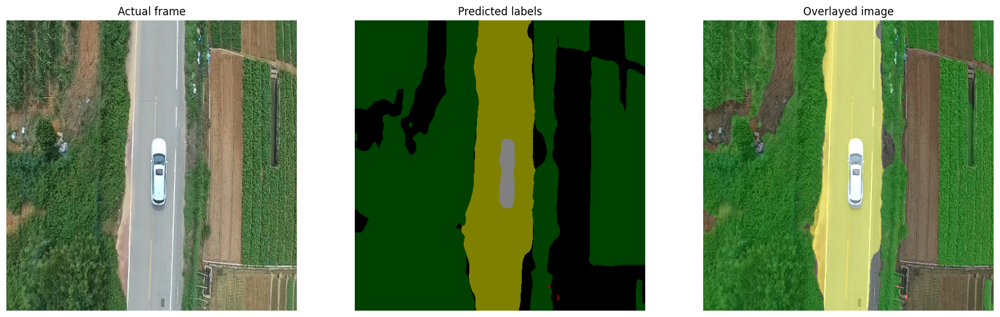

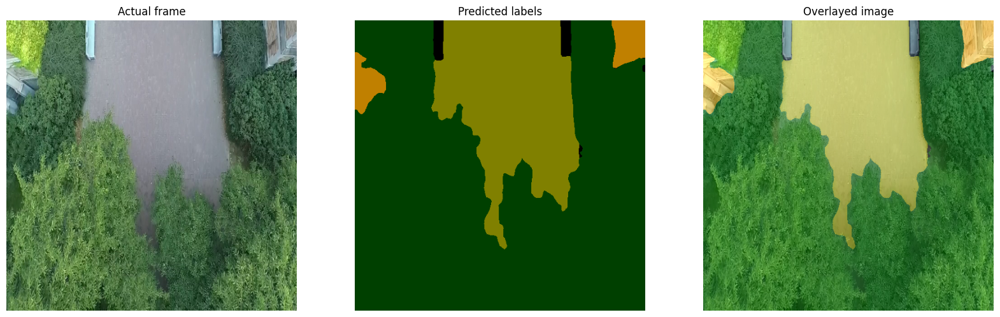

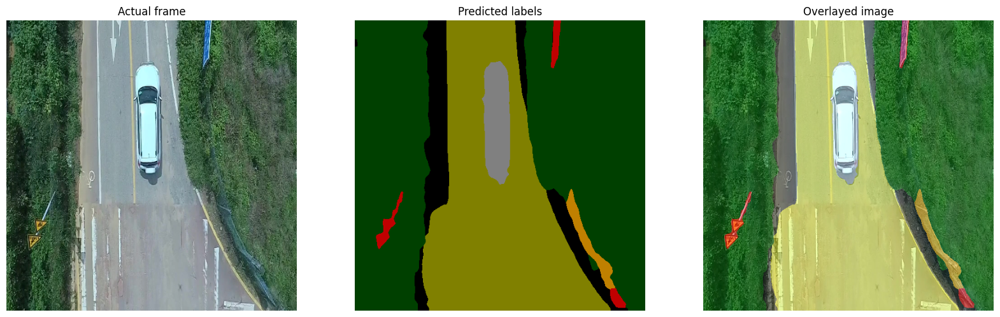

In [152]:
data1 = inference(model, test_loader,DEVICE)

In [153]:
len(data1)


7776

In [154]:
submission = pd.DataFrame(data1)
file_path = 'submission.csv'


In [155]:
len(submission)

7776

In [156]:
submission.head()

,ImageID,EncodedPixels
0,9743172603816335085_0,429 367 1709 367 2989 367 4269 367 5549 367 68...
1,9743172603816335085_1,466563 5 467843 5 469111 17 470389 22 471666 2...
2,9743172603816335085_2,424319 2 425596 5 426876 5 428154 7 429434 7 4...
3,9743172603816335085_3,
4,9743172603816335085_4,


In [157]:
submission.isna().sum()

ImageID          0
EncodedPixels    0
dtype: int64

In [158]:
submission.to_csv(file_path, index=False,na_rep='')
print(f"Submission file {file_path} created.")

Submission file submission.csv created.


In [159]:
import os
for dirname, _, filenames in os.walk('/kaggle/working'):
   # print(filenames)
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/working/submission.zip
/kaggle/working/submission.csv
/kaggle/working/model_checkpoint/DeepLabv3_AeroScapes_Dice_loss/version_0/ckpt.tar


In [160]:
df_s = pd.read_csv('/kaggle/working/submission.csv')
print(df_s.head())

                 ImageID                                      EncodedPixels
0  9743172603816335085_0  429 367 1709 367 2989 367 4269 367 5549 367 68...
1  9743172603816335085_1  466563 5 467843 5 469111 17 470389 22 471666 2...
2  9743172603816335085_2  424319 2 425596 5 426876 5 428154 7 429434 7 4...
3  9743172603816335085_3                                                NaN
4  9743172603816335085_4                                                NaN


In [161]:
len(df_s)

7776

In [162]:
# import zipfile

# # Specify the name of the CSV file
# csv_filename = 'submission.csv'
# # Specify the name of the zip file to be created
# zip_filename = 'submission.zip'

# # Create a ZipFile object
# with zipfile.ZipFile(zip_filename, 'w') as zipf:
#     # Add the CSV file to the zip file
#     zipf.write(csv_filename)

# print(f'{zip_filename} created successfully.')


In [163]:
%cd /kaggle/working
from IPython.display import FileLink
FileLink('submission.csv')

/kaggle/working


/kaggle/working/submission.csv

# <font style="color:green">6. Kaggle Profile Link [50 Points]</font>

Share your Kaggle profile link here with us so that we can give points for the competition score. 

You should have a minimum IoU of `0.60` on the test data to get all points. If the IoU is less than `0.55`, you will not get any points for the section. 

**You must have to submit `submission.csv` (prediction for images in `test.csv`) in `Submit Predictions` tab in Kaggle to get any evaluation in this section.**

UserName: Smruthi Sreenivas